In [88]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
import sys
from sklearn.metrics import r2_score
from matplotlib.lines import Line2D

sys.path.append('/Users/kjesta/Desktop/LABDATA/Kjersti_100226/')
sys.path.append('/Users/kjesta/Desktop/Master prosjekt/Master_code/Lab/')
sys.path.append('/Users/kjesta/Desktop/Master prosjekt/Processed_files/')

from funcs import *
from processing_funcs import *
from analysis_funcs import *

import matplotlib.style as mplstyle
mplstyle.use(["ggplot", "fast"])

import warnings
warnings.filterwarnings("ignore")

%load_ext autoreload
%autoreload 2

# For plotting
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.style as mplstyle
mplstyle.use(['ggplot', 'fast'])

mpl.rcParams['figure.dpi'] = 200
mpl.rcParams['font.size'] = 12
mpl.rcParams['axes.titlesize'] = 14
mpl.rcParams['axes.labelsize'] = 12
mpl.rcParams['xtick.labelsize'] = 12
mpl.rcParams['ytick.labelsize'] = 12

from matplotlib.transforms import ScaledTranslation
from matplotlib.colors import LinearSegmentedColormap
from cmocean import cm as cmo
from matplotlib.lines import Line2D
from matplotlib.colors import Normalize

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [89]:
data = {
    1.1: {
        0.1: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f11_a01_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f11_a01_p005_results.csv"),
        },
        0.2: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f11_a02_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f11_a02_p005_results.csv"),
        },
        0.3: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f11_a03_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f11_a03_p005_results.csv"),
        },
    },
    1.1: {
        0.1: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f11_a01_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f11_a01_p005_results.csv"),
        },
        0.2: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f11_a02_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f11_a02_p005_results.csv"),
        },
        0.3: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f11_a03_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f11_a03_p005_results.csv"),
        },
    },
    1.2: {
        0.1: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f12_a01_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f12_a01_p005_results.csv"),
        },
        0.2: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f12_a02_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f12_a02_p005_results.csv"),
        },
        0.3: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f12_a03_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f12_a03_p005_results.csv"),
        },
    },
    1.3: {
        0.1: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f13_a01_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f13_a01_p005_results.csv"),
        },
        0.2: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f13_a02_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f13_a02_p005_results.csv"),
        },
        0.3: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f13_a03_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f13_a03_p005_results.csv"),
        },
    },
    1.4: {
        0.1: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f14_a01_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f14_a01_p005_results.csv"),
        },
        0.2: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f14_a02_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f14_a02_p005_results.csv"),
        },
        0.3: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f14_a03_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f14_a03_p005_results.csv"),
        },
    },
    1.5: {
        0.1: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f15_a01_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f15_a01_p005_results.csv"),
        },
        0.2: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f15_a02_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f15_a02_p005_results.csv"),
        },
        0.3: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f15_a03_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f15_a03_p005_results.csv"),
        },
    },  
    1.6: {
        0.1: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f16_a01_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f16_a01_p005_results.csv"),
        },
        0.2: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f16_a02_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f16_a02_p005_results.csv"),
        },
        0.25: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f16_a025_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f16_a025_p005_results.csv"),
        },
        0.3: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f16_a03_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f16_a03_p005_results.csv"),
        },
    },
    1.7: {
        0.1: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f17_a01_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f17_a01_p005_results.csv"),
        },
        0.2: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f17_a02_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f17_a02_p005_results.csv"),
        },
        0.25: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f17_a025_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f17_a025_p005_results.csv"),
        },
        0.3: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f17_a03_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f17_a03_p005_results.csv"),
        },
    },
    1.8: {
        0.1: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f18_a01_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f18_a01_p005_results.csv"),
        },
        0.2: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f18_a02_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f18_a02_p005_results.csv"),
        },
        0.25: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f18_a025_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f18_a025_p005_results.csv"),
        },
        0.3: {
            None:  pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f18_a03_results.csv"),
            "p005": pd.read_csv("/Users/kjesta/Desktop/LABDATA/Calculated_amps/20cm_f18_a03_p005_results.csv"),
        },
    },
}

In [90]:
D = 0.2  # total water depth (m)
H = 0.15  # height of plates (m)

In [91]:
freqs = list(data.keys())
volts = []

for i in range(len(freqs)):
    volts.append(list(data[freqs[i]].keys()))

In [92]:
wavenumber = []

for f in freqs:
    wavenumber.append(estimate_wavenumber(f, D))

In [93]:
alpha_theo = []
alpha_weber = []

# Theoretical spatial damping coefficient for each wavenumber
# With 5 cm tall plates on 20 cm water depth
for k in wavenumber:
    al_theo, al_weber = spatial_damping_coefficient(k, D, H)
    alpha_theo.append(al_theo)
    alpha_weber.append(al_weber)

In [94]:
rows = []

for f, amps in data.items():         # outer: frequency
    for a, tags in amps.items():     # middle: amplitude
        for tag, df in tags.items(): # inner: None / "p005"
            for _, row in df.iterrows():
                if a == 0.1:
                    a_tag = 'low'
                if a == 0.2:
                    a_tag = 'medium'
                if a==0.25:
                    a_tag = 'medium-high'
                if a==0.3:
                    a_tag = 'high'
                
                rows.append({
                    "frequency": f,
                    "volt": a,
                    "volt_level": a_tag,
                    "tag": tag,
                    "run": row["Run"],          # R1 / R2 / R3
                    "Amp_obs_P0": row["Amp_obs_P0"],
                    "Amp_obs_P1": row["Amp_obs_P1"],
                    "Amp_obs_P2": row["Amp_obs_P2"],
                    "Amp_obs_P3": row["Amp_obs_P3"],
                    "Alpha_obs": row["Alpha_obs"],
                    "P3_minus_P0": row["P3_minus_P0"],
                    "ak": row["Amp_obs_P0"]*estimate_wavenumber(f, D),
                    "kH": estimate_wavenumber(f, D)*D,
                    "R": robin_parameter(H=H, a=row['Amp_obs_P0'], k=estimate_wavenumber(f, D))
                })

df = pd.DataFrame(rows)

In [95]:
df

,frequency,volt,volt_level,tag,run,Amp_obs_P0,Amp_obs_P1,Amp_obs_P2,Amp_obs_P3,Alpha_obs,P3_minus_P0,ak,kH,R
0,1.1,0.1,low,None,R1,0.004611,0.004522,0.004470,0.004397,0.010959,-0.000214,0.027155,1.177906,0.000235
1,1.1,0.1,low,None,R2,0.004599,0.004515,0.004472,0.004400,0.010128,-0.000199,0.027088,1.177906,0.000234
2,1.1,0.1,low,None,R3,0.004606,0.004508,0.004469,0.004396,0.010580,-0.000209,0.027125,1.177906,0.000235
3,1.1,0.1,low,p005,R1,0.004609,0.004467,0.004276,0.004102,0.027504,-0.000507,0.027145,1.177906,0.000235
4,1.1,0.1,low,p005,R2,0.004648,0.004509,0.004290,0.004134,0.028039,-0.000514,0.027372,1.177906,0.000237
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157,1.8,0.3,high,None,R2,0.028457,0.027989,0.021349,0.020158,0.089608,-0.008299,0.374876,2.634729,0.000648
158,1.8,0.3,high,None,R3,0.028701,0.027132,0.020556,0.021842,0.076761,-0.006858,0.378090,2.634729,0.000654
159,1.8,0.3,high,p005,R1,0.022247,0.020560,0.019312,0.021178,0.016653,-0.001069,0.293079,2.634729,0.000507
160,1.8,0.3,high,p005,R2,0.021790,0.020439,0.019601,0.027599,-0.042752,0.005810,0.287052,2.634729,0.000496


In [96]:
no_plates = df[df["tag"].isna()]
plates = df[df["tag"] == "p005"]

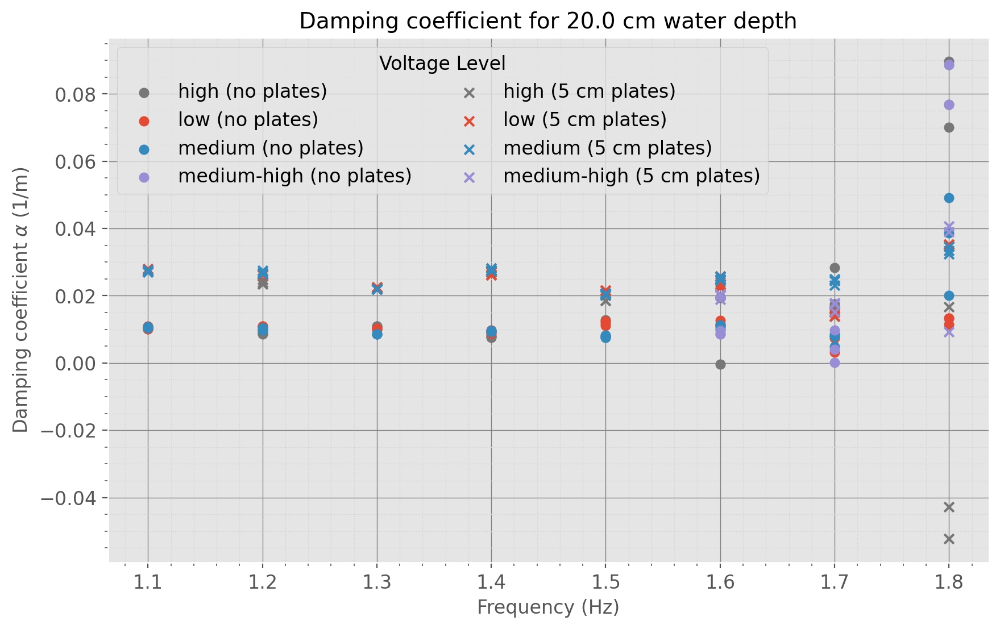

In [97]:
level_colors = {
    "low":  "C0",
    "medium":  "C1",
    "medium-high": "C2",
    "high": "C3",
}

fig, ax = plt.subplots(figsize=(10, 6))

for level, sub in no_plates.groupby("volt_level"):
    ax.scatter(sub["frequency"], sub["Alpha_obs"],
               marker='o',
               label=f'{level} (no plates)',
               color=level_colors.get(level, "gray"))

for level, sub in plates.groupby("volt_level"):
    ax.scatter(sub["frequency"], sub["Alpha_obs"],
               label=f'{level} (5 cm plates)',
               marker='x',
               color=level_colors.get(level, "gray"))


#ax.hlines(0, freqs[0]-0.01, freqs[-1]+0.01, colors='gray', alpha=0.7, linestyles='--')

plt.xlabel('Frequency (Hz)')
plt.ylabel(r'Damping coefficient $\alpha$ (1/m)')
plt.title(f'Damping coefficient for {D*100} cm water depth')

ax.legend(title="Voltage Level", ncol=2)
plt.minorticks_on()
plt.grid(which='major', linestyle='-', linewidth='0.5', color='gray')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='lightgray')

In [98]:
# Make sure you only keep the columns you need to avoid duplicate col names
cols_keep = ["frequency", "volt", "run", "volt_level", "Alpha_obs"]

np_df = no_plates[cols_keep].copy()
pl_df = plates[cols_keep].copy()

# Add suffixes to distinguish the two Alpha columns
np_df = np_df.rename(columns={"Alpha_obs": "Alpha_no"})
pl_df = pl_df.rename(columns={"Alpha_obs": "Alpha_pl"})

# Merge on frequency, volt, run (and optionally volt_level, but it should be consistent)
diff_df = pd.merge(
    np_df,
    pl_df,
    on=["frequency", "volt", "run", "volt_level"],
    how="inner"
)

# Compute difference: plates minus no plates
diff_df["Delta_alpha"] = diff_df["Alpha_pl"] - diff_df["Alpha_no"]

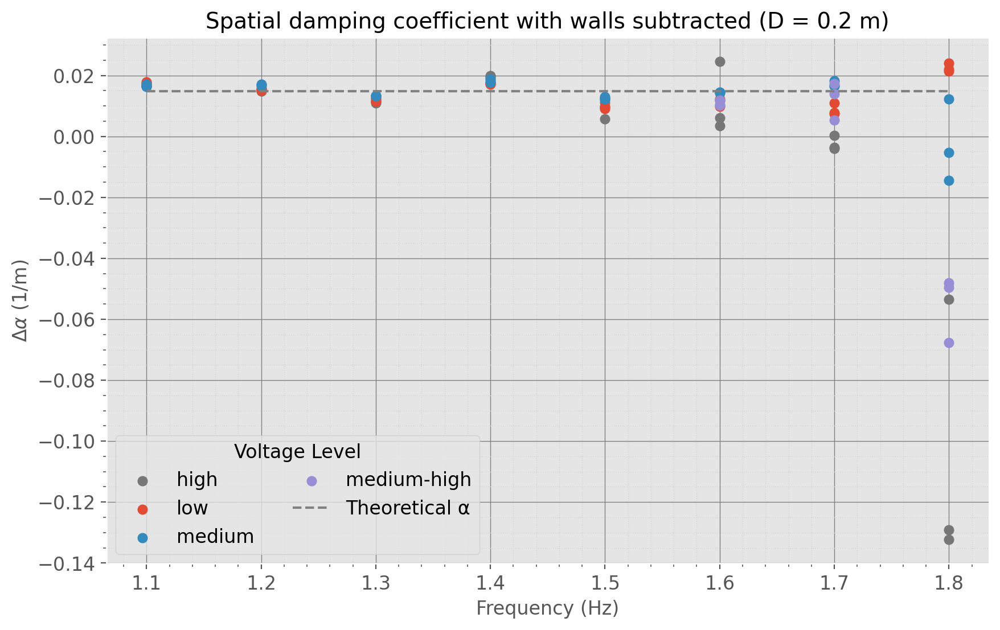

In [99]:
level_colors = {
    "low":         "C0",
    "medium":      "C1",
    "medium-high": "C2",
    "high":        "C3",
}

fig, ax = plt.subplots(figsize=(10, 6))

for level, sub in diff_df.groupby("volt_level"):
    ax.scatter(
        sub["frequency"],
        sub["Delta_alpha"],
        marker="o",
        label=f"{level}",
        color=level_colors.get(level, "gray"),
    )

ax.plot(freqs, alpha_theo, color='grey', linestyle='dashed', label='Theoretical α')

ax.set_xlabel("Frequency (Hz)")
ax.set_ylabel(r"$\Delta\alpha$ (1/m)")
ax.set_title(f"Spatial damping coefficient with walls subtracted (D = {D} m)")

ax.legend(title="Voltage Level", ncol=2)
plt.minorticks_on()
plt.grid(which="major", linestyle="-", linewidth=0.5, color="gray")
plt.grid(which="minor", linestyle=":", linewidth=0.5, color="lightgray")

Text(0.5, 1.0, 'Change in amplitude from first to last probe (D= 0.2 m )')

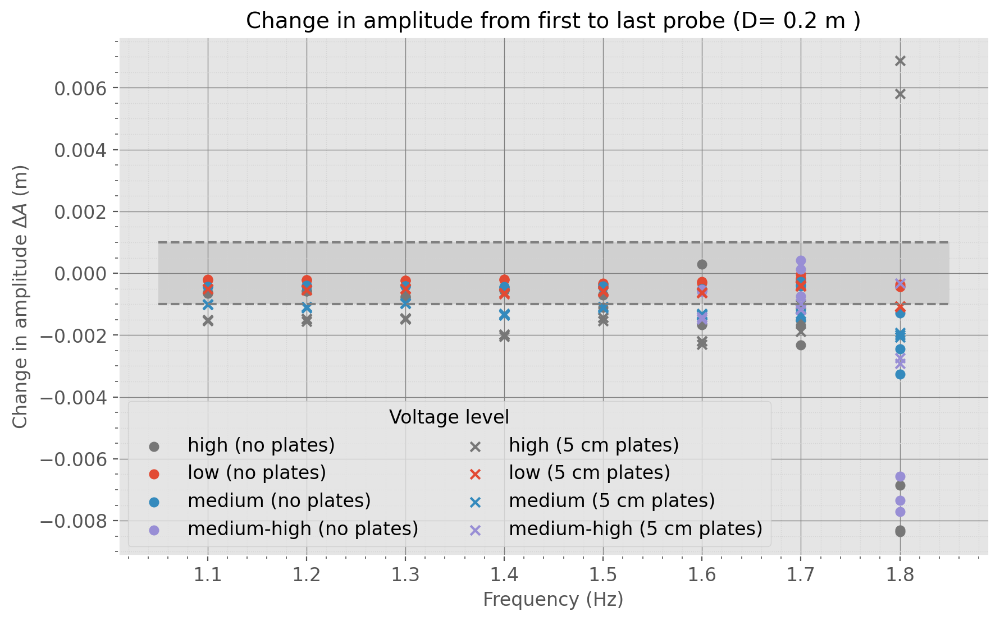

In [100]:
fig, ax = plt.subplots(figsize=(10, 6))

level_colors = {
    "low":  "C0",
    "medium":  "C1",
    "medium-high": "C2",
    "high": "C3",
}

for level, sub in no_plates.groupby("volt_level"):
    ax.scatter(sub["frequency"], sub["P3_minus_P0"],
               marker='o',
               label=f'{level} (no plates)',
               color=level_colors.get(level, "gray"))

for level, sub in plates.groupby("volt_level"):
    ax.scatter(sub["frequency"], sub["P3_minus_P0"],
               label=f'{level} (5 cm plates)',
               marker='x',
               color=level_colors.get(level, "gray"))


y1 = 0.001
y2 = -0.001

xmin = freqs[0] - 0.05
xmax = freqs[-1] + 0.05

plt.hlines(y1, xmin=xmin, xmax=xmax, colors='grey', linestyles='dashed')
plt.hlines(y2, xmin=xmin, xmax=xmax, colors='grey', linestyles='dashed')

x_fill = np.linspace(xmin, xmax, 50)
plt.fill_between(x_fill, y1, y2,
                 color='grey', alpha=0.2, edgecolor='none', zorder=0)

plt.legend(title='Voltage level', loc='lower left', ncol=2)
plt.minorticks_on()
plt.grid(which='major', linestyle='-', linewidth='0.5', color='gray')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='lightgray')

plt.xlabel('Frequency (Hz)')
plt.ylabel(r'Change in amplitude $\Delta A$ (m)')
plt.title(f'Change in amplitude from first to last probe (D= {D} m )')

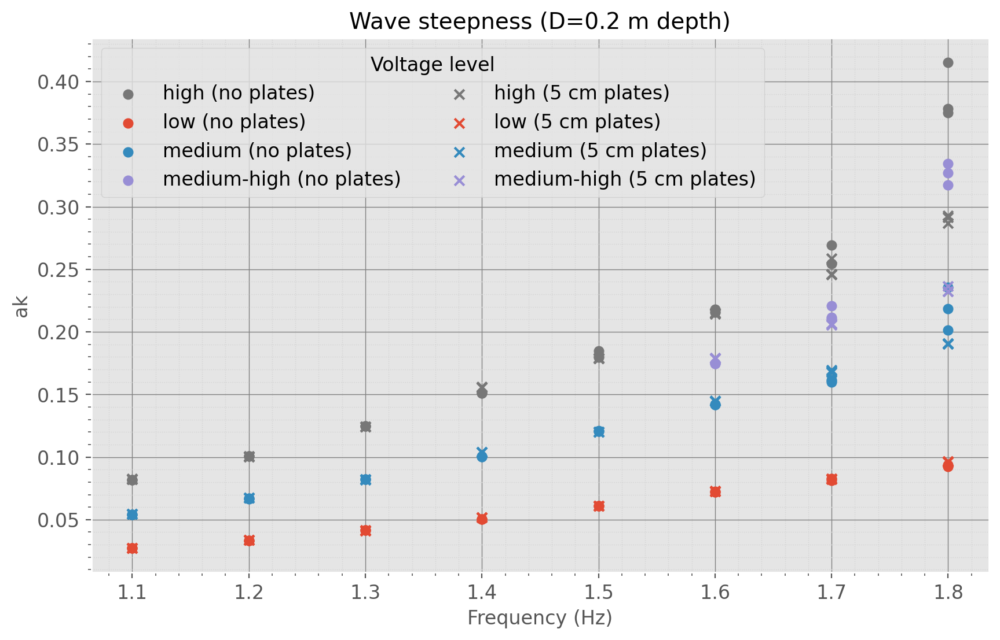

In [101]:
fig, ax = plt.subplots(figsize=(10, 6))

level_colors = {
    "low":  "C0",
    "medium":  "C1",
    "medium-high": "C2",
    "high": "C3",
}

for level, sub in no_plates.groupby("volt_level"):
    ax.scatter(sub["frequency"], sub["ak"],
               marker='o',
               label=f'{level} (no plates)',
               color=level_colors.get(level, "gray"))

for level, sub in plates.groupby("volt_level"):
    ax.scatter(sub["frequency"], sub["ak"],
               label=f'{level} (5 cm plates)',
               marker='x',
               color=level_colors.get(level, "gray"))

ax.set_xlabel('Frequency (Hz)')
ax.set_ylabel('ak')
ax.set_title(f'Wave steepness (D={D} m depth)')
ax.legend(title='Voltage level', loc='upper left', ncol=2)

plt.minorticks_on()
plt.grid(which='major', linestyle='-', linewidth='0.5', color='gray')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='lightgray')

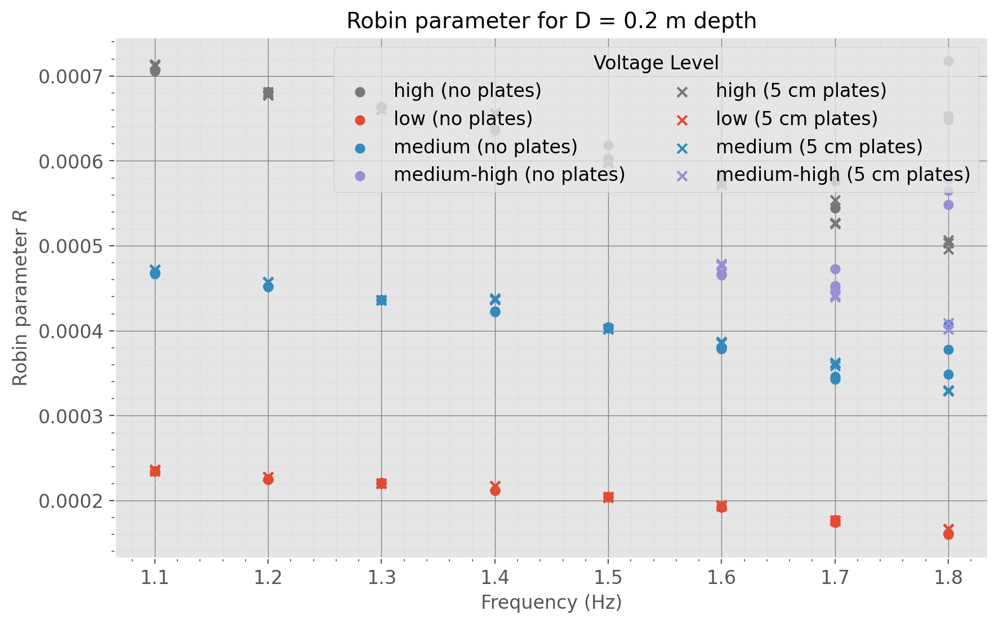

In [103]:
level_colors = {
    "low":  "C0",
    "medium":  "C1",
    "medium-high": "C2",
    "high": "C3",
}

fig, ax = plt.subplots(figsize=(10, 6))

for level, sub in no_plates.groupby("volt_level"):
    ax.scatter(sub["frequency"], sub["R"],
               marker='o',
               label=f'{level} (no plates)',
               color=level_colors.get(level, "gray"))

for level, sub in plates.groupby("volt_level"):
    ax.scatter(sub["frequency"], sub["R"],
               label=f'{level} (5 cm plates)',
               marker='x',
               color=level_colors.get(level, "gray"))


plt.xlabel('Frequency (Hz)')
plt.ylabel(r'Robin parameter $R$')
plt.title(f'Robin parameter for D = {D} m depth')

ax.legend(title="Voltage Level", ncol=2)
plt.minorticks_on()
plt.grid(which='major', linestyle='-', linewidth='0.5', color='gray')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='lightgray')

In [104]:
x_probe_pos = np.array([4.86, 6.69, 7.87, 9.15])

In [110]:
freqs = list(data.keys())
volts = [0.1, 0.2, 0.25, 0.3]
cond = [None, 'p005']

def plot_amp_profile(freq):
    if freq in [1.1, 1.2, 1.3, 1.4, 1.5]:
        volts = [0.1, 0.2, 0.3]
    else:
        volts = [0.1, 0.2, 0.25, 0.3]
    
    a_th = alpha_theo[freqs.index(freq)]

    for v in volts:
        df_no = data[freq][v][None]
        df_p = data[freq][v]["p005"]

        # Extract amplitudes and normalize by first probe amplitude
        amps_no_r1 = np.array([df_no["Amp_obs_P0"][0], df_no["Amp_obs_P1"][0], df_no["Amp_obs_P2"][0], df_no["Amp_obs_P3"][0]])
        amps_no_r2 = np.array([df_no["Amp_obs_P0"][1], df_no["Amp_obs_P1"][1], df_no["Amp_obs_P2"][1], df_no["Amp_obs_P3"][1]])
        amps_no_r3 = np.array([df_no["Amp_obs_P0"][2], df_no["Amp_obs_P1"][2], df_no["Amp_obs_P2"][2], df_no["Amp_obs_P3"][2]])

        amps_p_r1 = np.array([df_p["Amp_obs_P0"][0], df_p["Amp_obs_P1"][0], df_p["Amp_obs_P2"][0], df_p["Amp_obs_P3"][0]])
        amps_p_r2 = np.array([df_p["Amp_obs_P0"][1], df_p["Amp_obs_P1"][1], df_p["Amp_obs_P2"][1], df_p["Amp_obs_P3"][1]])
        amps_p_r3 = np.array([df_p["Amp_obs_P0"][2], df_p["Amp_obs_P1"][2], df_p["Amp_obs_P2"][2], df_p["Amp_obs_P3"][2]])

        amps_r1_no_norm = amps_no_r1 / df_no["Amp_obs_P0"][0]
        amps_r2_no_norm = amps_no_r2 / df_no["Amp_obs_P0"][1]
        amps_r3_no_norm = amps_no_r3 / df_no["Amp_obs_P0"][2]

        amps_r1_p_norm = amps_p_r1 / df_p["Amp_obs_P0"][0]
        amps_r2_p_norm = amps_p_r2 / df_p["Amp_obs_P0"][1]
        amps_r3_p_norm = amps_p_r3 / df_p["Amp_obs_P0"][2]

        # Extract errors
        err_no_r1 = np.array([df_no['Amp_errors_P0'][0], df_no['Amp_errors_P1'][0], df_no['Amp_errors_P2'][0], df_no['Amp_errors_P3'][0]]) / df_no["Amp_obs_P0"][0]
        err_no_r2 = np.array([df_no['Amp_errors_P0'][1], df_no['Amp_errors_P1'][1], df_no['Amp_errors_P2'][1], df_no['Amp_errors_P3'][1]]) / df_no["Amp_obs_P0"][1]
        err_no_r3 = np.array([df_no['Amp_errors_P0'][2], df_no['Amp_errors_P1'][2], df_no['Amp_errors_P2'][2], df_no['Amp_errors_P3'][2]]) / df_no["Amp_obs_P0"][2]

        err_p_r1 = np.array([df_p['Amp_errors_P0'][0], df_p['Amp_errors_P1'][0], df_p['Amp_errors_P2'][0], df_p['Amp_errors_P3'][0]]) / df_p["Amp_obs_P0"][0]
        err_p_r2 = np.array([df_p['Amp_errors_P0'][1], df_p['Amp_errors_P1'][1], df_p['Amp_errors_P2'][1], df_p['Amp_errors_P3'][1]]) / df_p["Amp_obs_P0"][1]
        err_p_r3 = np.array([df_p['Amp_errors_P0'][2], df_p['Amp_errors_P1'][2], df_p['Amp_errors_P2'][2], df_p['Amp_errors_P3'][2]]) / df_p["Amp_obs_P0"][2]

        # Amplitude change
        delta_no_r1 = amps_no_r3 - amps_no_r1
        delta_no_r2 = amps_no_r3 - amps_no_r2
        delta_no_r3 = amps_no_r3 - amps_no_r3

        delta_p_r1 = amps_p_r3 - amps_p_r1
        delta_p_r2 = amps_p_r3 - amps_p_r2
        delta_p_r3 = amps_p_r3 - amps_p_r3  

        fig, ax = plt.subplots(figsize=(8, 5))
        ax.errorbar(x_probe_pos, amps_r1_no_norm, yerr=err_no_r1, fmt='o-', label='No plates', color='C0')
        ax.errorbar(x_probe_pos, amps_r2_no_norm, yerr=err_no_r2, fmt='o-', color='C0')
        ax.errorbar(x_probe_pos, amps_r3_no_norm, yerr=err_no_r3, fmt='o-', color='C0')
        ax.errorbar(x_probe_pos, amps_r1_p_norm, yerr=err_p_r1, fmt='s--', label='5 cm plates', color='C1')
        ax.errorbar(x_probe_pos, amps_r2_p_norm, yerr=err_p_r2, fmt='s--',  color='C1')
        ax.errorbar(x_probe_pos, amps_r3_p_norm, yerr=err_p_r3, fmt='s--',  color='C1')
        x_prof = x_probe_pos - x_probe_pos[0]  # Shift so that first probe is at x=0

        ax.plot(x_probe_pos, np.exp(-df_no["Alpha_obs"][0]*x_prof), color='gray', linestyle='dashed', label='Exp. decay (no plates)')
        ax.plot(x_probe_pos, np.exp(-df_p["Alpha_obs"][0]*x_prof), color='black', linestyle='dashed', label='Exp. decay (5 cm plates)')
        #ax.plot(x_probe_pos, np.exp(-a_th*x_prof), color='red', linestyle='dashed', label='Theoretical exp. decay')

        ax.set_xlabel('Distance from wave maker (m)')
        ax.set_ylabel('Normalized amplitude')
        ax.set_title(f'f={freq} Hz, A={v} V, D = {D} m')
        ax.legend() 
        plt.minorticks_on()
        plt.grid(which='major', linestyle='-', linewidth='0.5', color='gray')
        plt.grid(which='minor', linestyle=':', linewidth='0.5', color='lightgray')
        plt.show()

In [116]:
freqs = list(data.keys())
volts = [0.1, 0.2, 0.25, 0.3]
cond = [None, 'p005']

def plot_decay_profile(freq):
    if freq in [1.1, 1.2, 1.3, 1.4, 1.5]:
        volts = [0.1, 0.2, 0.3]
    else:
        volts = [0.1, 0.2, 0.25, 0.3]
    
    a_th = alpha_theo[freqs.index(freq)]

    for v in volts:
        df_no = data[freq][v][None]
        df_p = data[freq][v]["p005"]

        # Extract amplitudes and normalize by first probe amplitude
        amps_no_r1 = np.array([df_no["Amp_obs_P0"][0], df_no["Amp_obs_P1"][0], df_no["Amp_obs_P2"][0], df_no["Amp_obs_P3"][0]])
        amps_no_r2 = np.array([df_no["Amp_obs_P0"][1], df_no["Amp_obs_P1"][1], df_no["Amp_obs_P2"][1], df_no["Amp_obs_P3"][1]])
        amps_no_r3 = np.array([df_no["Amp_obs_P0"][2], df_no["Amp_obs_P1"][2], df_no["Amp_obs_P2"][2], df_no["Amp_obs_P3"][2]])

        amps_p_r1 = np.array([df_p["Amp_obs_P0"][0], df_p["Amp_obs_P1"][0], df_p["Amp_obs_P2"][0], df_p["Amp_obs_P3"][0]])
        amps_p_r2 = np.array([df_p["Amp_obs_P0"][1], df_p["Amp_obs_P1"][1], df_p["Amp_obs_P2"][1], df_p["Amp_obs_P3"][1]])
        amps_p_r3 = np.array([df_p["Amp_obs_P0"][2], df_p["Amp_obs_P1"][2], df_p["Amp_obs_P2"][2], df_p["Amp_obs_P3"][2]])

        # Amplitude change
        delta_no_r1 = amps_no_r3 - amps_no_r1
        delta_no_r2 = amps_no_r3 - amps_no_r2
        delta_no_r3 = amps_no_r3 - amps_no_r3

        delta_p_r1 = amps_p_r3 - amps_p_r1
        delta_p_r2 = amps_p_r3 - amps_p_r2
        delta_p_r3 = amps_p_r3 - amps_p_r3  

        fig, ax = plt.subplots(figsize=(8, 5))
        x_prof = x_probe_pos - x_probe_pos[0]  # Shift so that first probe is at x=0

        ax.plot(x_probe_pos, np.exp(-df_no["Alpha_obs"][0]*x_prof), color='gray', linestyle='dashed', label='Exp. decay (no plates)')
        ax.plot(x_probe_pos, np.exp(-df_p["Alpha_obs"][0]*x_prof), color='black', linestyle='dashed', label='Exp. decay (5 cm plates)')
        ax.plot(x_probe_pos, np.exp(-((df_p["Alpha_obs"][0] - df_no["Alpha_obs"][0]))*x_prof), color='C0', linestyle='dashed', label='Exp. decay (difference)')
        ax.plot(x_probe_pos, np.exp(-a_th*x_prof), color='C1', linestyle='dashed', label='Theoretical exp. decay')

        # Add text box with change in amplitude
        ax.text(0.05, 0.95, f'ΔA_no_r1: {delta_no_r1[0]:.3f}\nΔA_no_r2: {delta_no_r2[0]:.3f}\nΔA_no_r3: {delta_no_r3[0]:.3f}', transform=ax.transAxes, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))


        ax.set_xlabel('Distance from wave maker (m)')
        ax.set_ylabel('Normalized amplitude')
        ax.set_title(f'f={freq} Hz, A={v} V, D = {D} m')
        ax.legend() 
        plt.minorticks_on()
        plt.grid(which='major', linestyle='-', linewidth='0.5', color='gray')
        plt.grid(which='minor', linestyle=':', linewidth='0.5', color='lightgray')
        plt.show()

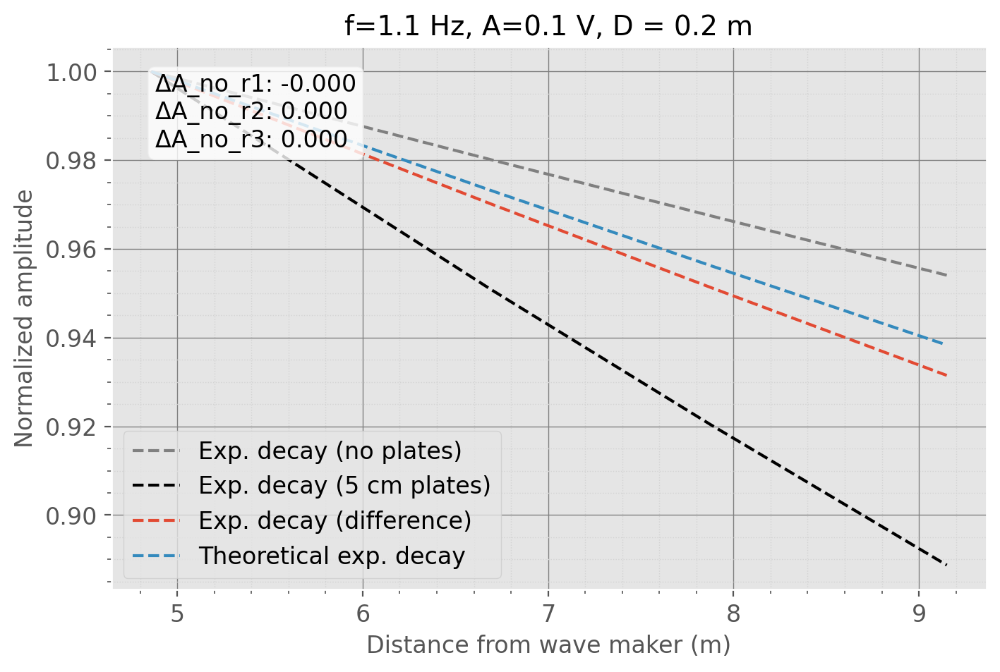

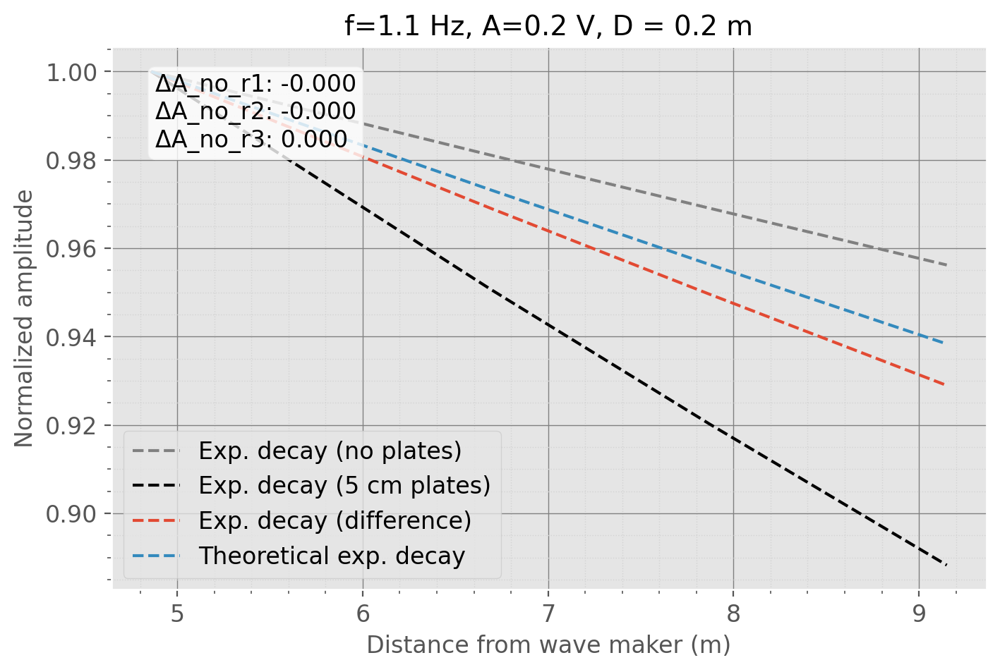

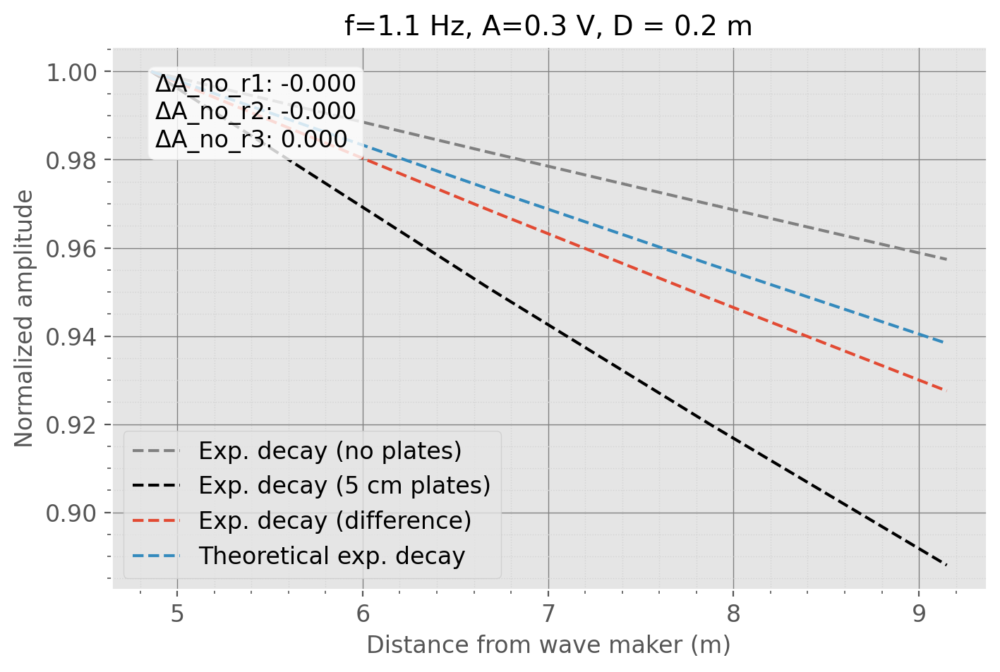

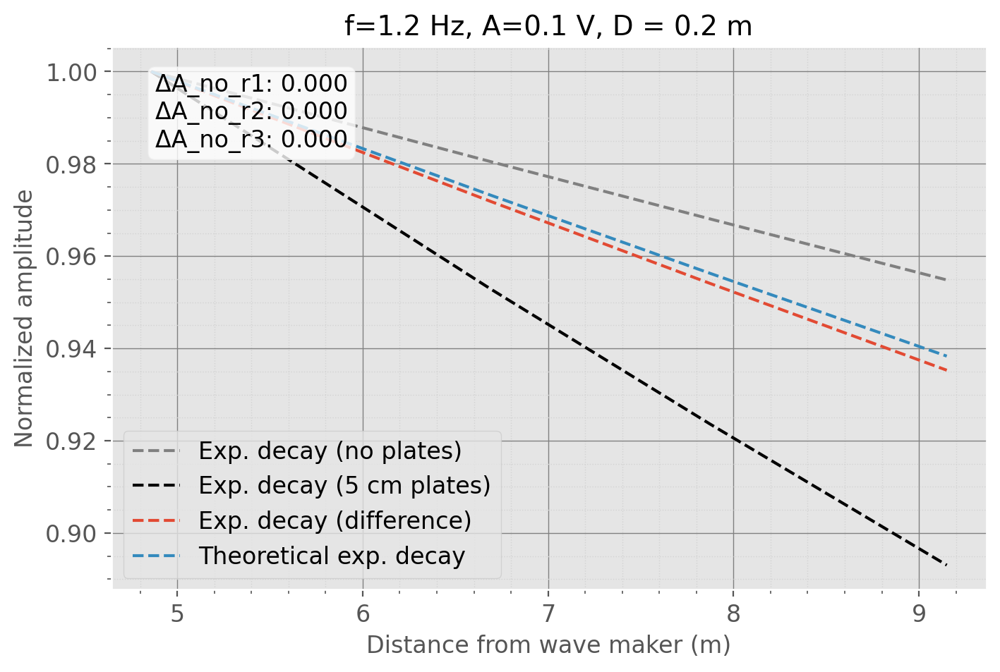

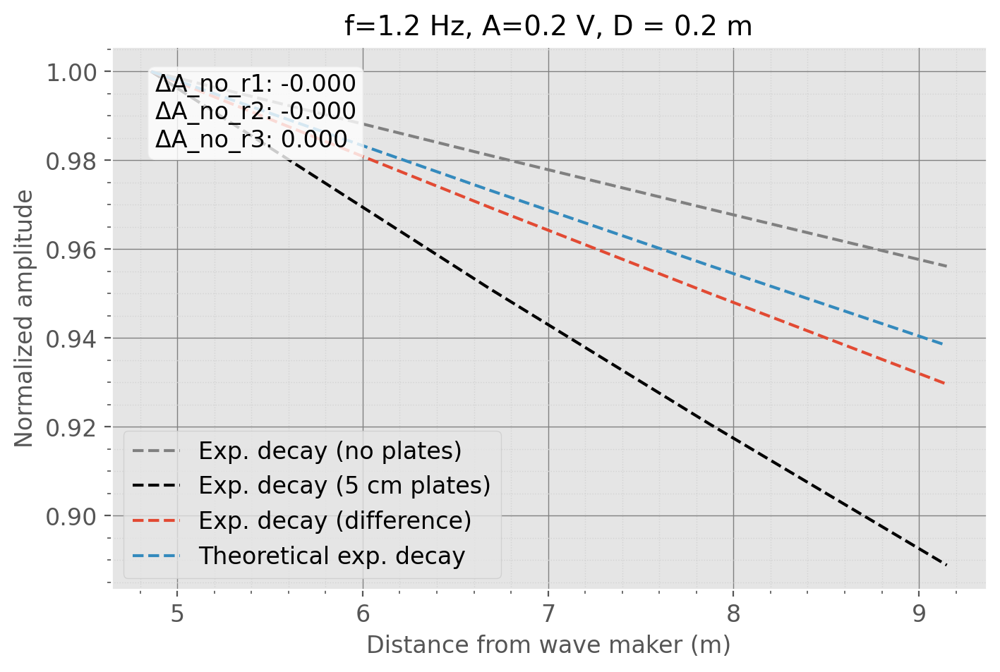

...

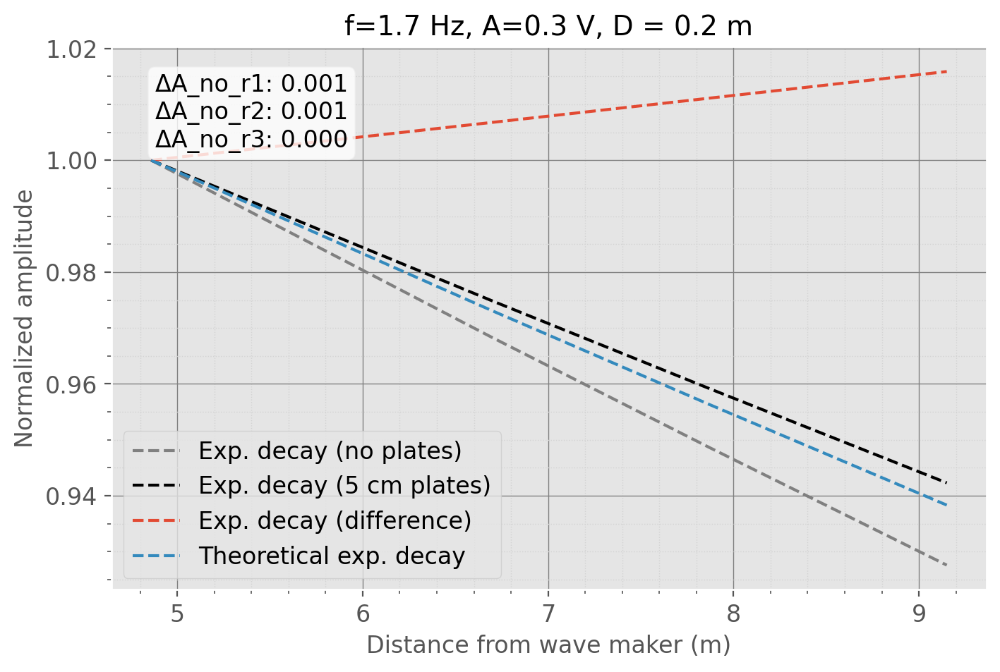

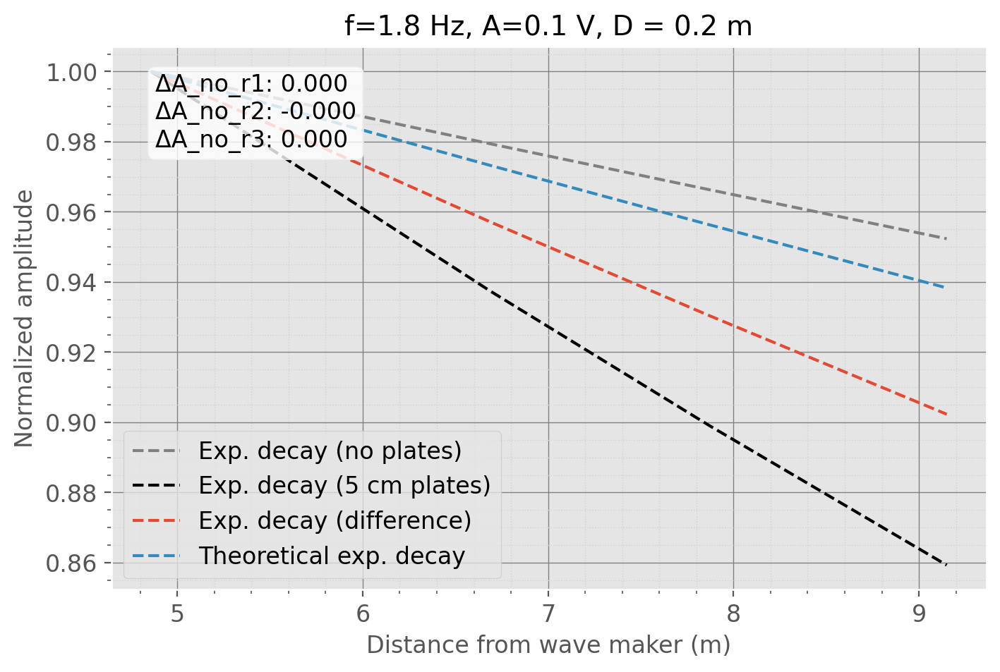

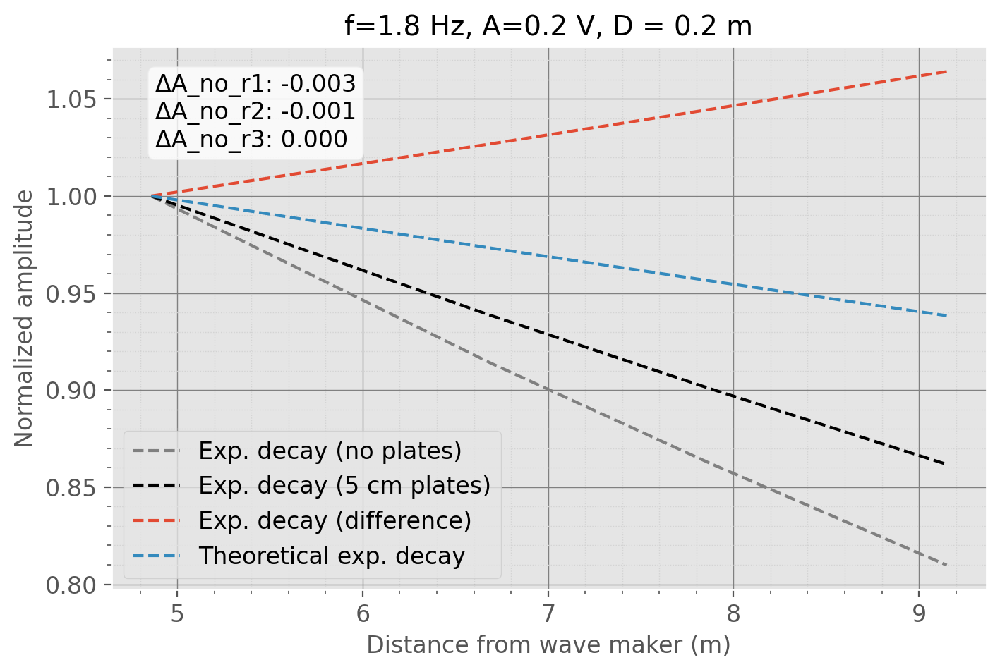

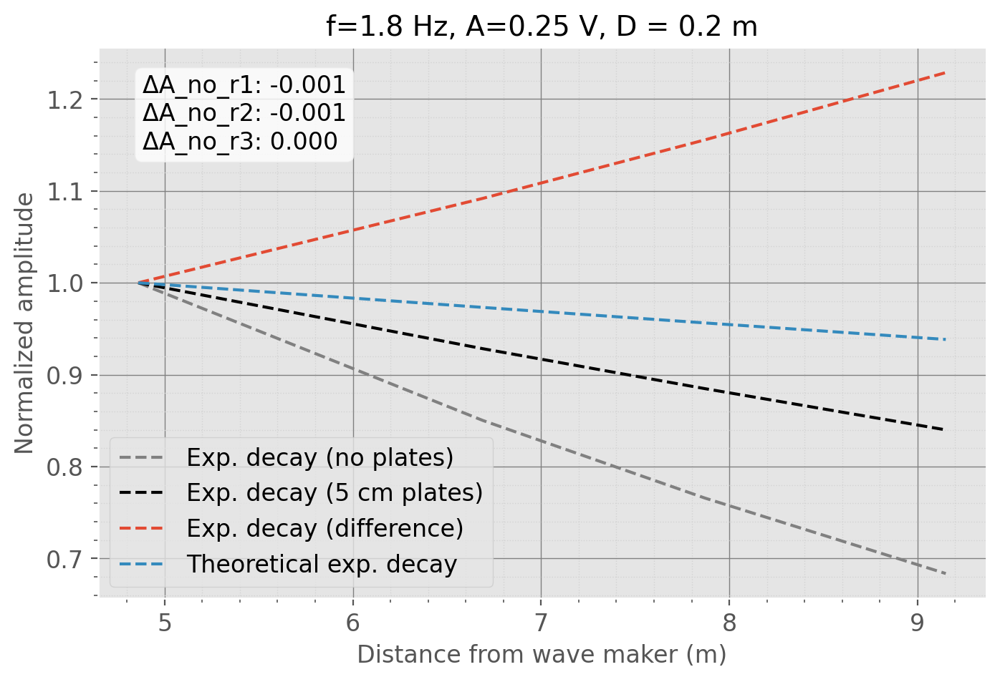

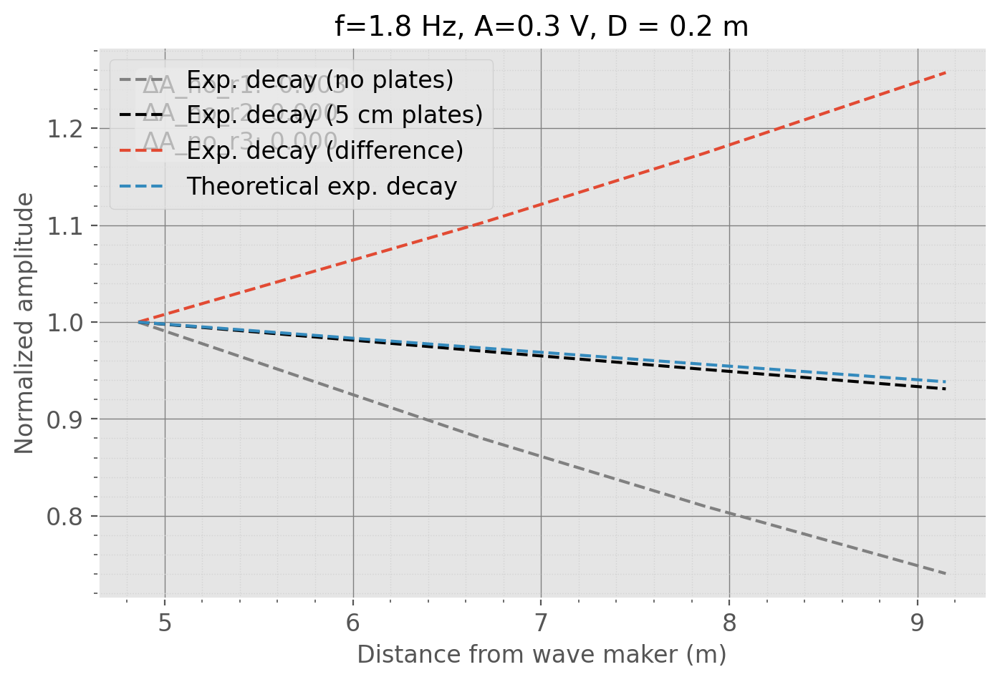

In [117]:
for f in freqs:
    plot_decay_profile(f)

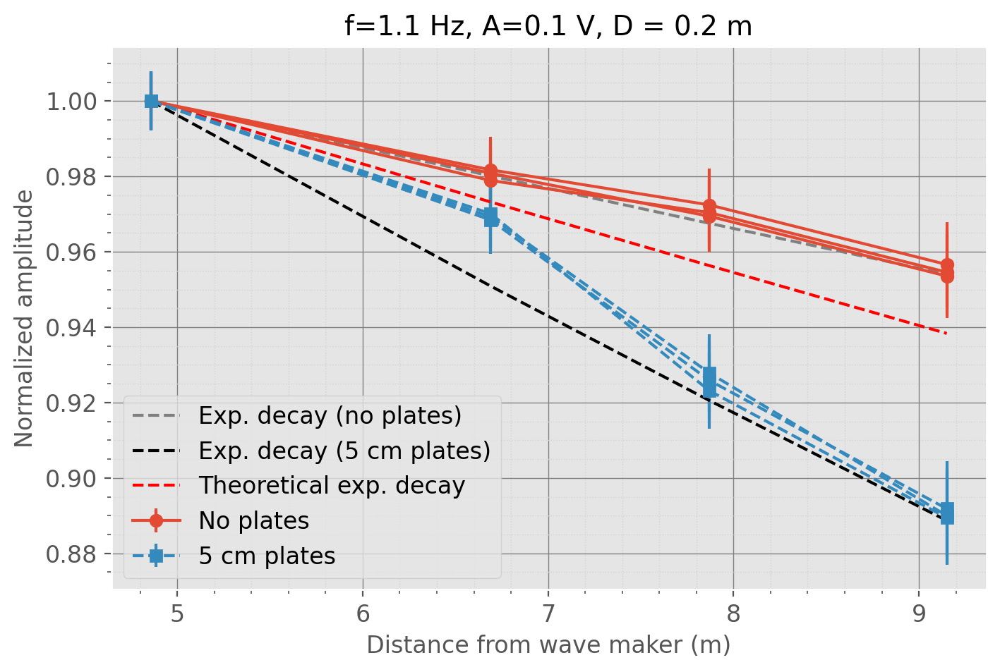

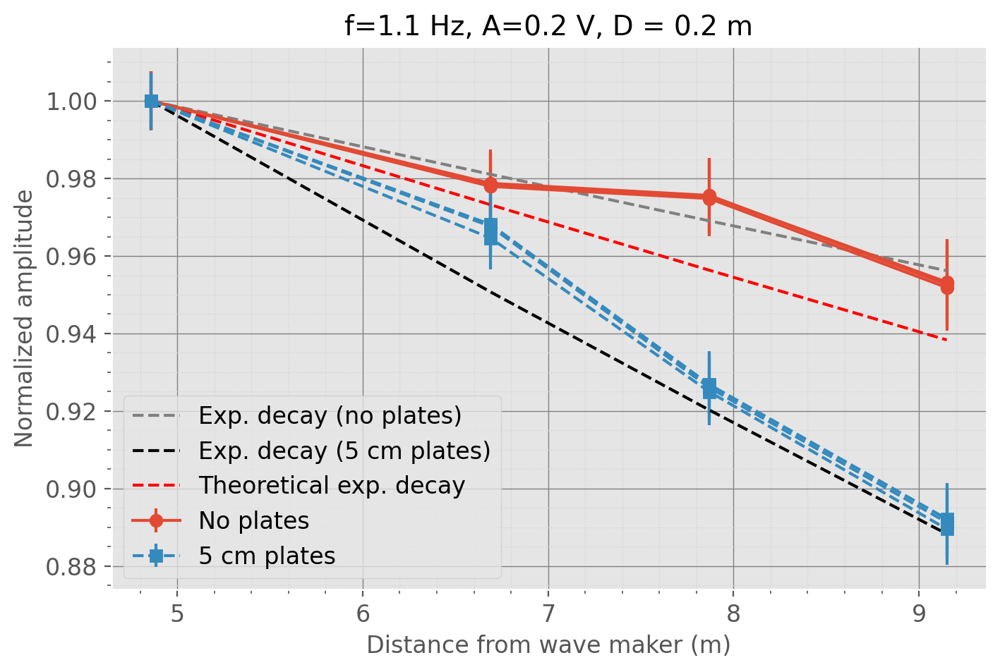

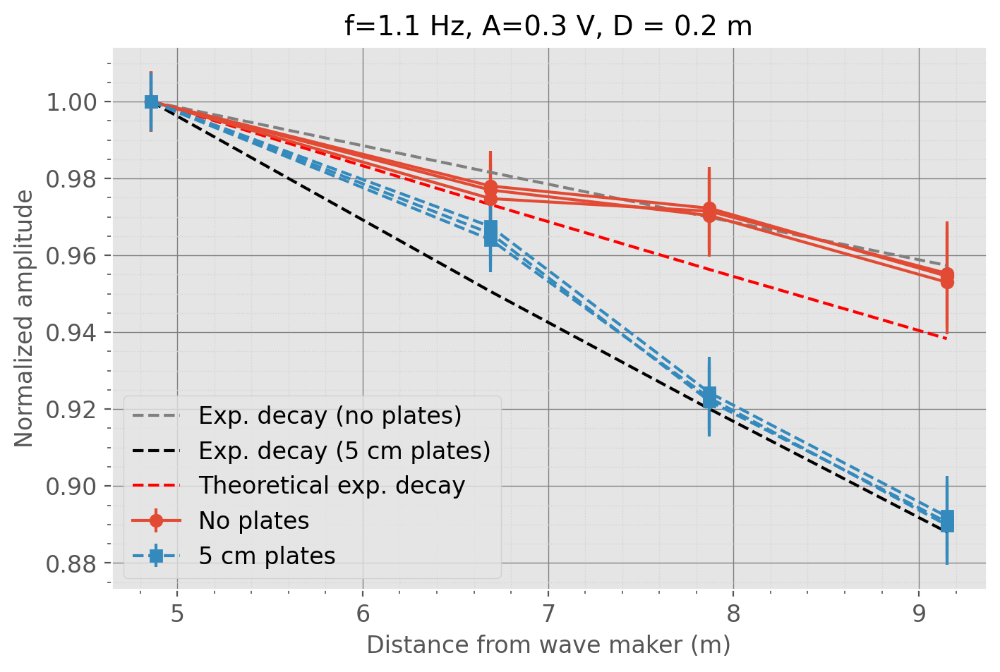

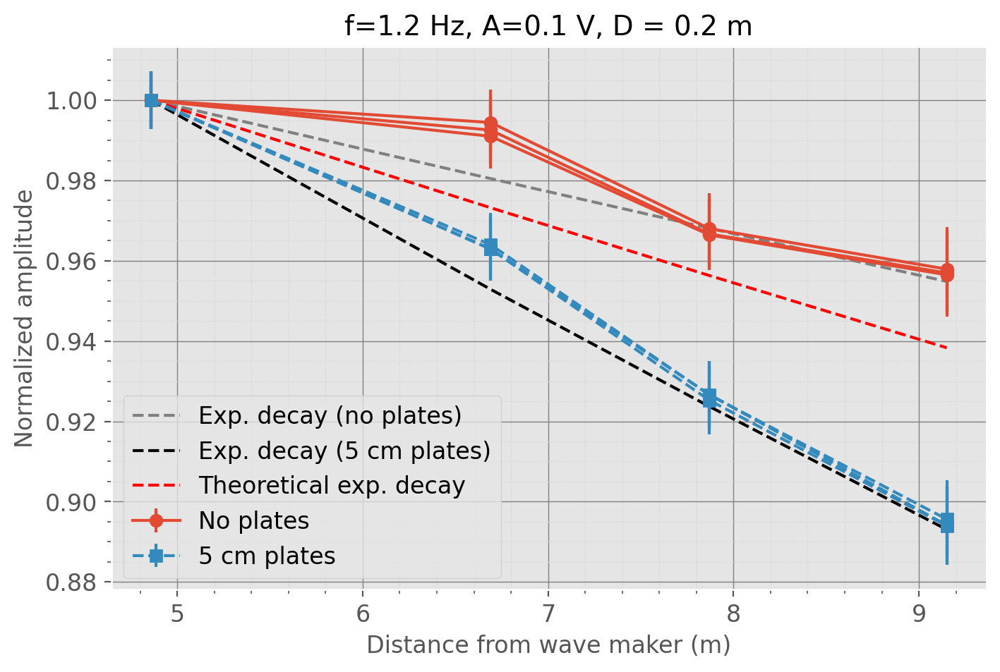

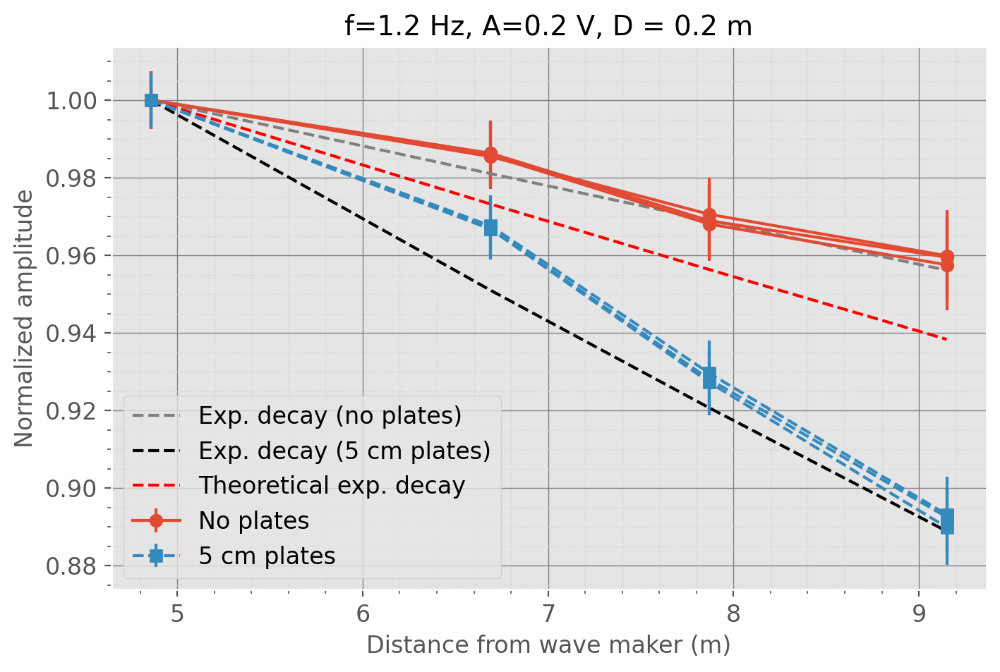

...

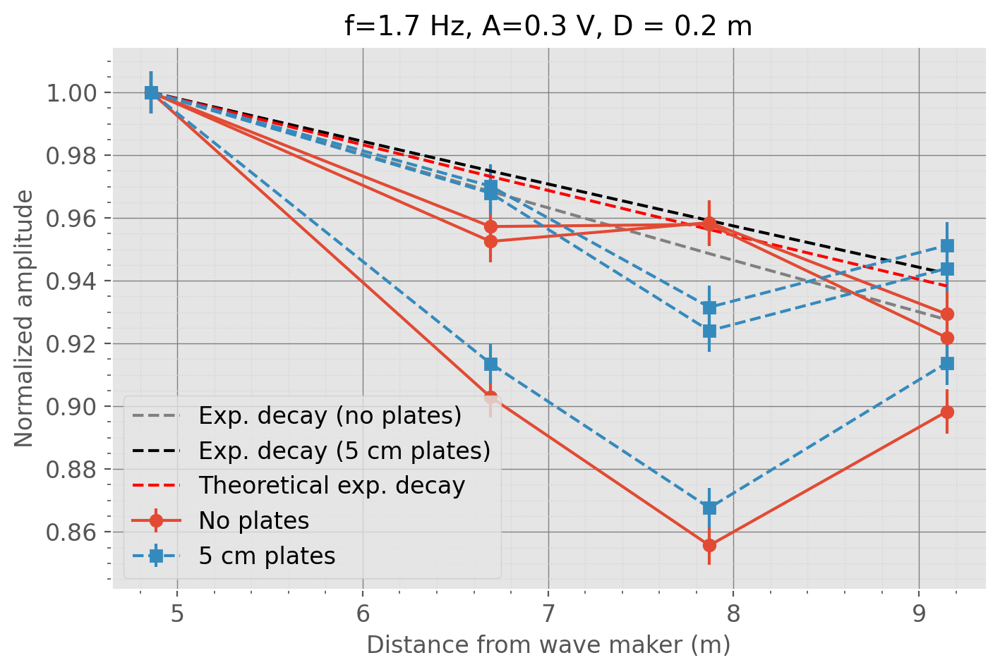

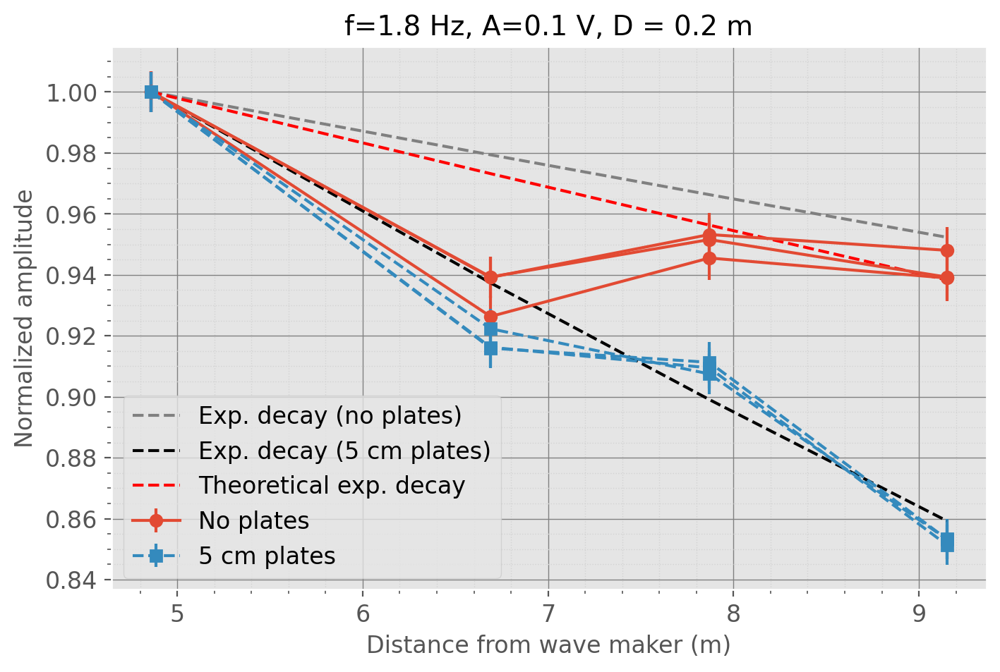

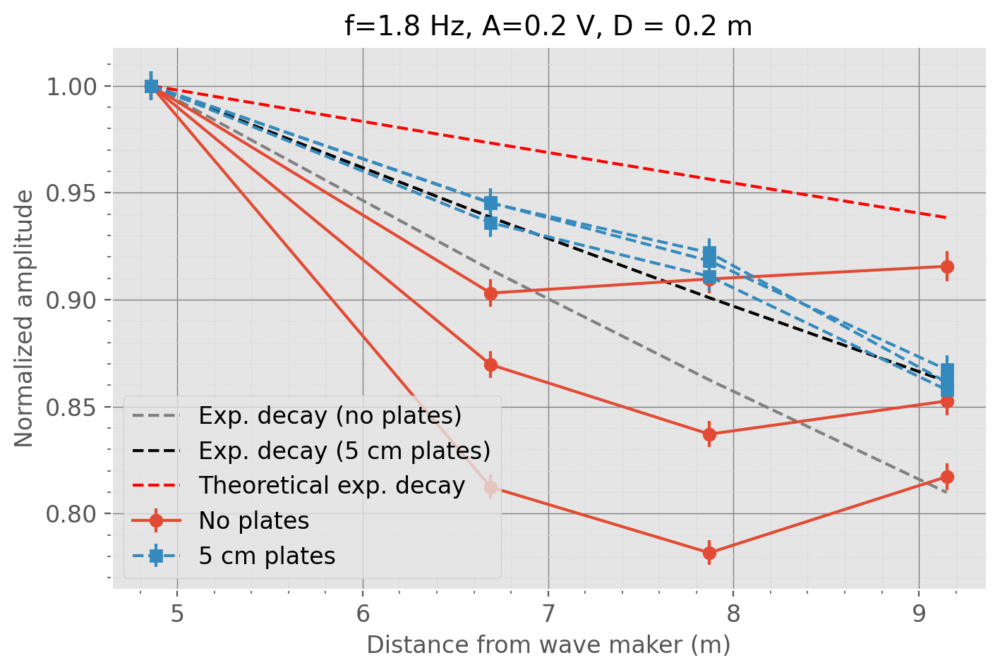

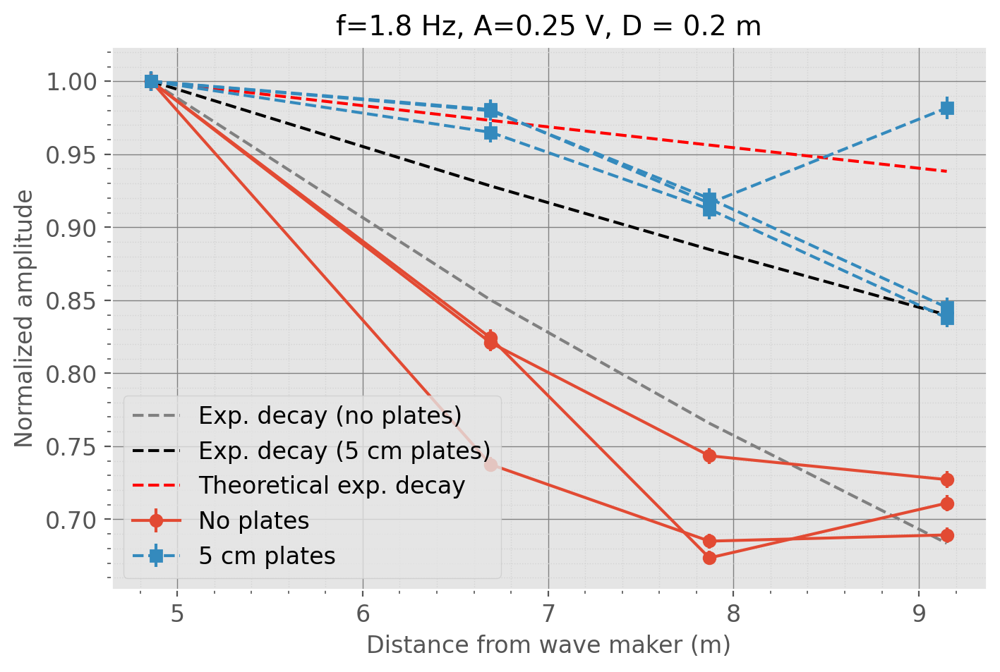

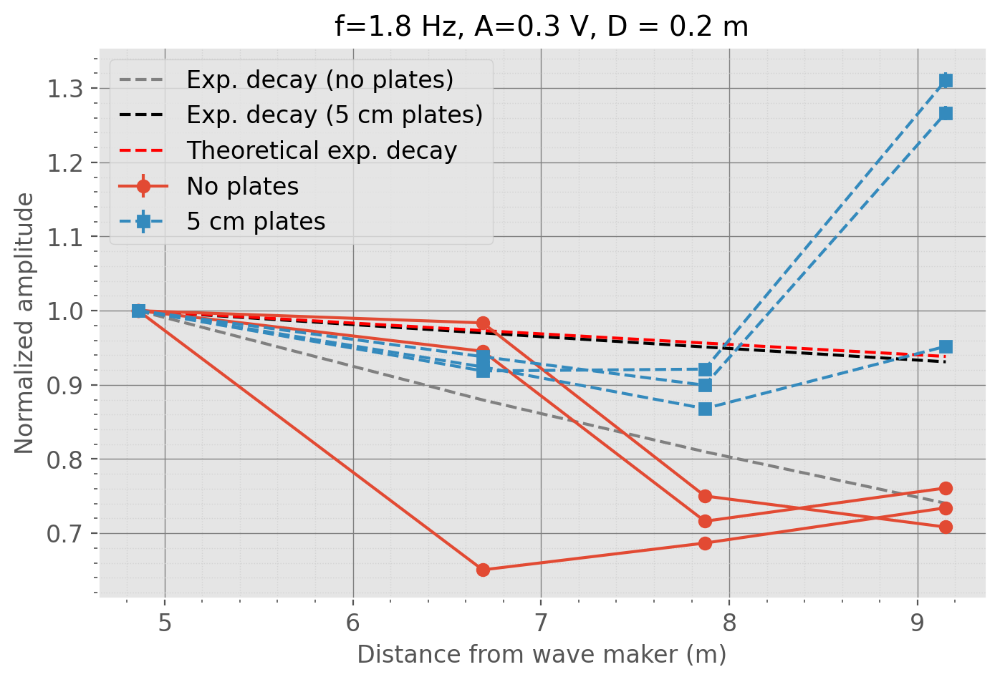

In [109]:
for f in freqs:
    plot_amp_profile(f)